<h1>BIKE SALES 2023

<h3>PROJECT

<h4>INTIALIZING PACKAGE

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

<h5>READING CSV FILE

In [2]:
df=pd.read_csv(r"bike_sales_100k.csv")
df=df.sample(50000)
print(df.to_string())

       Sale_ID        Date  Customer_ID     Bike_Model    Price  Quantity Store_Location  Salesperson_ID Payment_Method  Customer_Age Customer_Gender
44340    44341  22-03-2022         6115      Road Bike  2855.99         3   Philadelphia             870     Google Pay            29          Female
41074    41075  23-05-2023         7822      Road Bike  4429.66         3        Phoenix             373         PayPal            48            Male
93362    93363  01-05-2022         1870    Hybrid Bike   734.85         2        Houston             608         PayPal            59            Male
7862      7863  14-06-2021         4873  Mountain Bike  3133.33         1        Houston             688     Debit Card            22          Female
79959    79960  17-09-2023         5354  Mountain Bike  1562.52         3        Houston             218           Cash            35            Male
75713    75714  06-01-2023         7163  Mountain Bike  3693.41         3    San Antonio            

<h5>CLEANING DATA

In [3]:
df.duplicated()

44340    False
41074    False
93362    False
7862     False
79959    False
         ...  
48698    False
44178    False
98782    False
45317    False
12169    False
Length: 50000, dtype: bool

In [4]:
df.describe()

,Sale_ID,Customer_ID,Price,Quantity,Salesperson_ID,Customer_Age
count,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,49862.486260,5487.639620,2604.267383,2.999220,550.748980,44.125060
std,28895.132702,2596.204737,1382.267690,1.415069,260.062903,15.322594
min,1.000000,1000.000000,200.010000,1.000000,100.000000,18.000000
25%,24729.750000,3239.750000,1407.670000,2.000000,325.000000,31.000000
50%,49762.500000,5494.000000,2613.830000,3.000000,551.000000,44.000000
75%,74844.500000,7728.000000,3795.980000,4.000000,778.000000,57.000000
max,99997.000000,9999.000000,4999.710000,5.000000,999.000000,70.000000


In [5]:
df.isnull().sum()

Sale_ID            0
Date               0
Customer_ID        0
Bike_Model         0
Price              0
Quantity           0
Store_Location     0
Salesperson_ID     0
Payment_Method     0
Customer_Age       0
Customer_Gender    0
dtype: int64

1.How have bike sales changed over time?

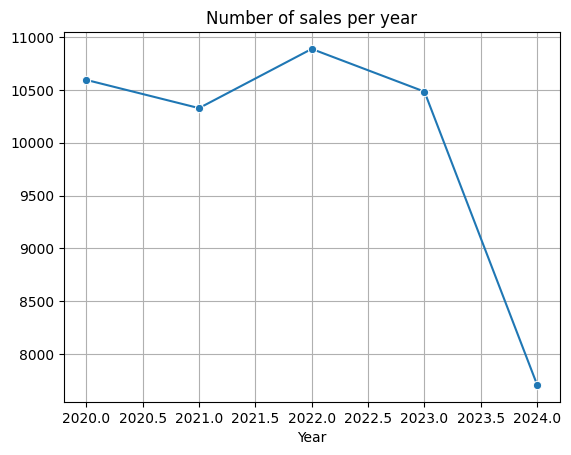

In [6]:
df['Date']=pd.to_datetime(df['Date'],dayfirst=True)
df['Year']=df['Date'].dt.year
yearly_sales=df.groupby('Year').size()
sns.lineplot(x=yearly_sales.index,y=yearly_sales.values,marker='o').set_title('Number of sales per year')
plt.grid()
plt.show()



The conclusion from the plot provides insight into the business’s performance over time. It can help stakeholders understand long-term trends in bike sales, informing future decisions such as marketing strategies, inventory management, and potential areas for improvement.

2.Which months have the highest sales?

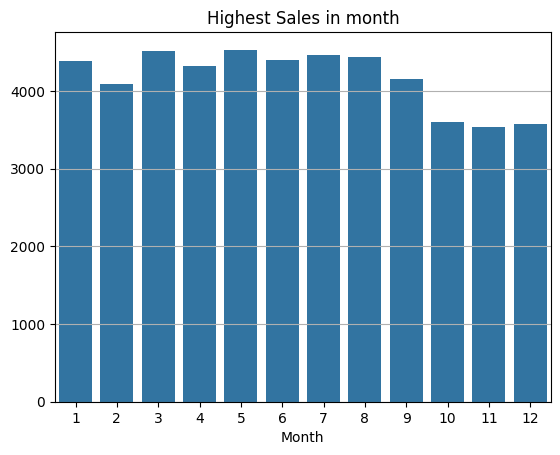

In [7]:
df['Month']=df['Date'].dt.month
monthly_sales=df.groupby('Month').size()
sns.barplot(x=monthly_sales.index,y=monthly_sales.values).set_title('Highest Sales in month')
plt.grid(axis='y')



By identifying the months with the highest sales, the business can strategically focus its resources and plan promotions around those times to maximize profitability. It also helps in anticipating and managing seasonal fluctuations effectively.

In [8]:
print(df.to_string())

       Sale_ID       Date  Customer_ID     Bike_Model    Price  Quantity Store_Location  Salesperson_ID Payment_Method  Customer_Age Customer_Gender  Year  Month
44340    44341 2022-03-22         6115      Road Bike  2855.99         3   Philadelphia             870     Google Pay            29          Female  2022      3
41074    41075 2023-05-23         7822      Road Bike  4429.66         3        Phoenix             373         PayPal            48            Male  2023      5
93362    93363 2022-05-01         1870    Hybrid Bike   734.85         2        Houston             608         PayPal            59            Male  2022      5
7862      7863 2021-06-14         4873  Mountain Bike  3133.33         1        Houston             688     Debit Card            22          Female  2021      6
79959    79960 2023-09-17         5354  Mountain Bike  1562.52         3        Houston             218           Cash            35            Male  2023      9
75713    75714 2023-01-06   

3.What is the distribution of bike purchases by customer age group?

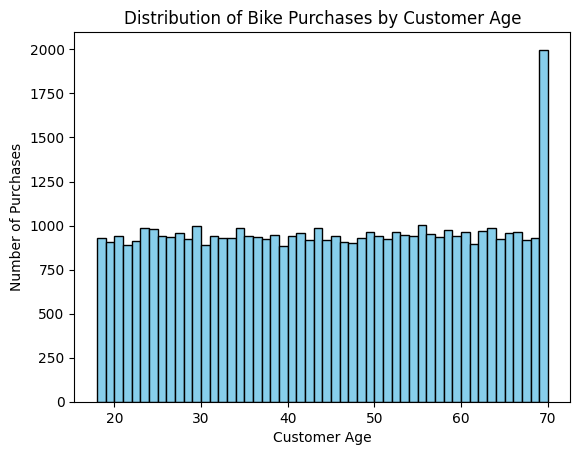

In [9]:
df['Customer_Age'].plot.hist(bins=52, edgecolor='black', color='skyblue')
plt.title('Distribution of Bike Purchases by Customer Age')
plt.xlabel('Customer Age')
plt.ylabel('Number of Purchases')
plt.show()



The distribution plot of bike purchases across different age groups shows how purchasing behavior varies with age. If the data is heavily concentrated around a particular age range, it indicates that a certain demographic is more inclined to purchase bikes. For instance, if there is a peak in the 20-30 age range, it suggests that younger adults are the primary customers. Conversely, if the distribution is spread out or has multiple peaks, it could indicate a broader customer base with multiple age groups showing interest in buying bikes.

4.How does the gender distribution of customers affect bike purchases?

C:\Users\abhij\AppData\Local\Temp\ipykernel_14436\2960355291.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=gender_purchases.index, y=gender_purchases.values, palette='coolwarm')


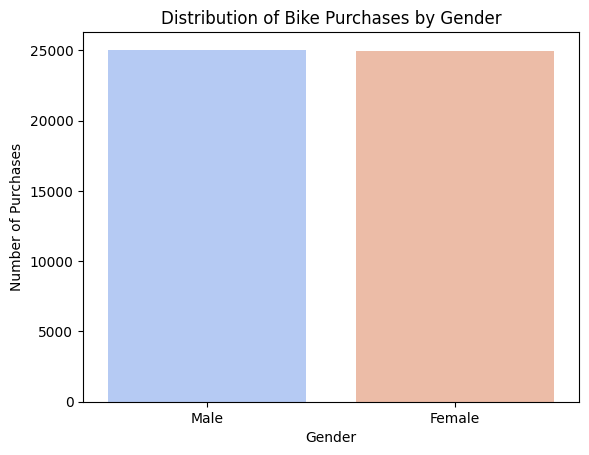

Customer_Gender
Male      25035
Female    24965
Name: count, dtype: int64

In [10]:
gender_purchases = df['Customer_Gender'].value_counts()
sns.barplot(x=gender_purchases.index, y=gender_purchases.values, palette='coolwarm')
plt.title('Distribution of Bike Purchases by Gender')
plt.xlabel('Gender')
plt.ylabel('Number of Purchases')
plt.show()
gender_purchases

If one gender significantly outpaces the other in purchase volume, it suggests a tendency for bike purchases to be more popular within that group. For instance, if male customers have a higher count, the bike store might focus on models and marketing strategies that align with preferences often observed among male customers, such as mountain bikes or road bikes geared towards sports and performance. Conversely, if female customers are well-represented or even lead in purchases, the store might consider enhancing product selections, marketing, and features that align with preferences observed in that group, potentially highlighting city bikes or models that emphasize comfort and style.

5.Which bike models are the most popular among customers?

C:\Users\abhij\AppData\Local\Temp\ipykernel_14436\3698352607.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=bike_count.index,y=bike_count.values,palette='viridis').set_title('Most Saled bikes')


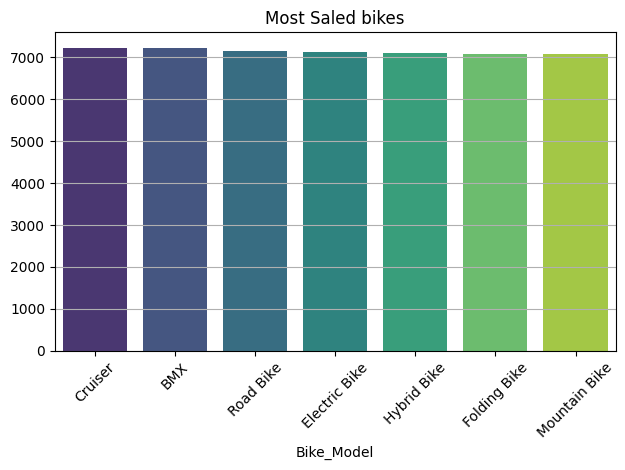

Bike_Model
Cruiser          7232
BMX              7227
Road Bike        7160
Electric Bike    7129
Hybrid Bike      7106
Folding Bike     7075
Mountain Bike    7071
Name: count, dtype: int64

In [11]:
bike_count=df['Bike_Model'].value_counts()
sns.barplot(x=bike_count.index,y=bike_count.values,palette='viridis').set_title('Most Saled bikes')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()
df['Bike_Model'].value_counts()


The bar plot of bike model sales reveals the popularity of different models among customers. The models with the highest sales are evidently more favored, which could be due to specific attributes like design, versatility, pricing, or alignment with current biking trends.

6.What is the average price of different bike models?

C:\Users\abhij\AppData\Local\Temp\ipykernel_14436\3163862346.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=avg_price.index,y=avg_price.values,palette='husl')


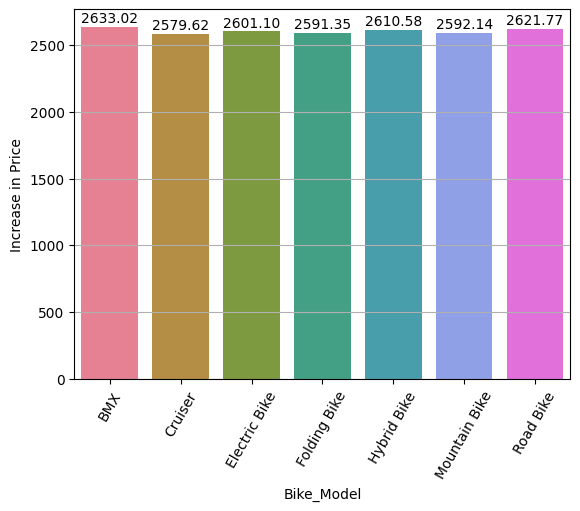

Bike_Model
BMX              2633.02
Cruiser          2579.62
Electric Bike    2601.10
Folding Bike     2591.35
Hybrid Bike      2610.58
Mountain Bike    2592.14
Road Bike        2621.77
Name: Price, dtype: float64

In [12]:
avg_price=df.groupby('Bike_Model')['Price'].agg('mean').round(2)
sns.barplot(x=avg_price.index,y=avg_price.values,palette='husl')
plt.xticks(rotation=60)
plt.grid(axis='y')
plt.ylabel('Increase in Price')
for index, value in enumerate(avg_price.values):
    plt.text(index, value + 10, f'{value:.2f}', ha='center', va='bottom')
plt.show()
avg_price



The average price plot of different bike models shows a clear range in pricing, suggesting that certain models cater to premium, high-performance needs while others are more budget-friendly. This variation allows the store to target a broad customer base, from casual riders to dedicated cyclists, by offering models that align with diverse preferences and budgets.

7.Which stores generate the most revenue?

C:\Users\abhij\AppData\Local\Temp\ipykernel_14436\1354704302.py:1: FutureWarning: The provided callable <built-in function max> is currently using SeriesGroupBy.max. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "max" instead.
  max_revenue=df.groupby('Store_Location')['Price'].agg(max)
C:\Users\abhij\AppData\Local\Temp\ipykernel_14436\1354704302.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=max_revenue.index,y=max_revenue.values,palette='CMRmap').set_title('Most Revenue Stores')


Store_Location
Chicago         4999.71
Houston         4999.17
Los Angeles     4998.23
New York        4999.58
Philadelphia    4999.70
Phoenix         4998.31
San Antonio     4999.38
Name: Price, dtype: float64

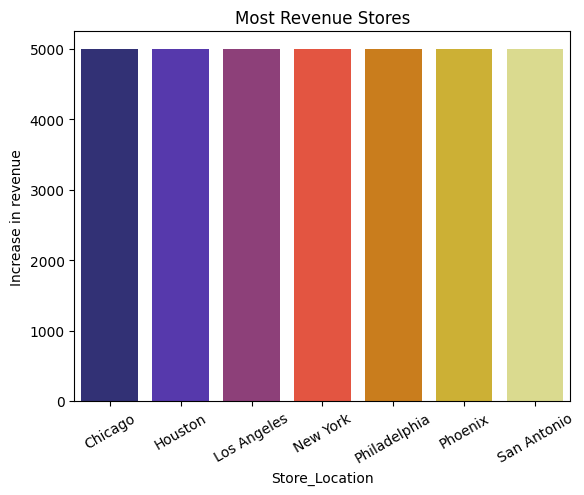

In [13]:
max_revenue=df.groupby('Store_Location')['Price'].agg(max)
sns.barplot(x=max_revenue.index,y=max_revenue.values,palette='CMRmap').set_title('Most Revenue Stores')
plt.xticks(rotation=30)
plt.ylabel('Increase in revenue')
max_revenue


The revenue analysis by store location shows which stores generate the highest sales revenue, indicating areas with strong customer demand and effective sales performance. Stores with the highest revenue may benefit from continued investment and inventory prioritization, while locations with lower revenue could explore targeted promotions or community engagement to boost sales.

8.How do sales vary by store location?

C:\Users\abhij\AppData\Local\Temp\ipykernel_14436\233863225.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=stores.index,y=stores.values,palette='hls').set_title('Sales Vary By Stores')


Store_Location
New York        7192
Philadelphia    7187
San Antonio     7175
Phoenix         7159
Houston         7120
Chicago         7093
Los Angeles     7074
Name: count, dtype: int64

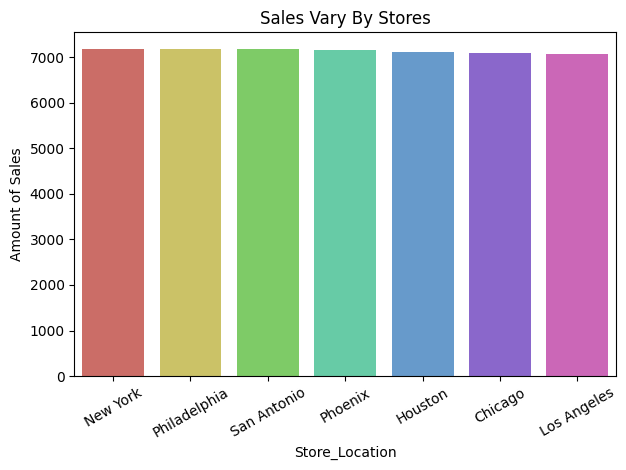

In [14]:
stores=df['Store_Location'].value_counts()
sns.barplot(x=stores.index,y=stores.values,palette='hls').set_title('Sales Vary By Stores')
plt.ylabel('Amount of Sales')
plt.xticks(rotation=30)
plt.tight_layout() 
stores




Sales vary significantly by store location, indicating that certain locations experience higher customer demand and transaction volumes than others.

9.What is the distribution of sales across different payment methods?

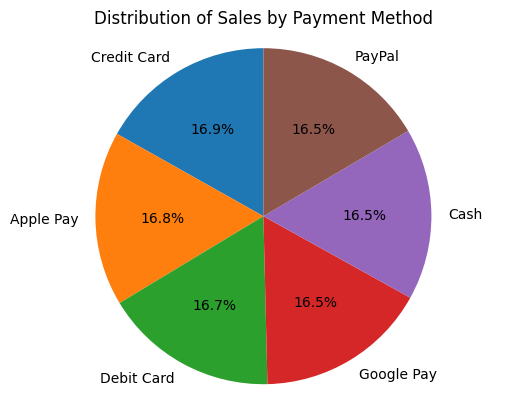

In [15]:
saless=df['Payment_Method'].value_counts()
plt.pie(saless, labels=saless.index, autopct='%1.1f%%', startangle=90)
plt.title('Distribution of Sales by Payment Method')
plt.axis('equal') 
plt.show()


The distribution of sales across payment methods reveals customer preferences, with certain methods being more commonly used, highlighting preferred transaction types at the store.

In [16]:
df

,Sale_ID,Date,Customer_ID,Bike_Model,Price,Quantity,Store_Location,Salesperson_ID,Payment_Method,Customer_Age,Customer_Gender,Year,Month
44340,44341,2022-03-22,6115,Road Bike,2855.99,3,Philadelphia,870,Google Pay,29,Female,2022,3
41074,41075,2023-05-23,7822,Road Bike,4429.66,3,Phoenix,373,PayPal,48,Male,2023,5
93362,93363,2022-05-01,1870,Hybrid Bike,734.85,2,Houston,608,PayPal,59,Male,2022,5
7862,7863,2021-06-14,4873,Mountain Bike,3133.33,1,Houston,688,Debit Card,22,Female,2021,6
79959,79960,2023-09-17,5354,Mountain Bike,1562.52,3,Houston,218,Cash,35,Male,2023,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...
48698,48699,2021-01-14,9964,BMX,4428.84,3,New York,496,Google Pay,51,Female,2021,1
44178,44179,2023-02-02,8325,Electric Bike,4911.91,5,Los Angeles,146,Credit Card,41,Female,2023,2
98782,98783,2020-12-30,5205,Electric Bike,1187.58,4,Phoenix,957,Apple Pay,53,Female,2020,12
45317,45318,2021-12-02,7726,Hybrid Bike,2220.07,5,Chicago,506,Google Pay,32,Male,2021,12


10.What is the distribution of sales by different payment methods?

Payment_Method
Credit Card    8425
Apple Pay      8398
Debit Card     8369
Google Pay     8274
Cash           8270
PayPal         8264
Name: count, dtype: int64

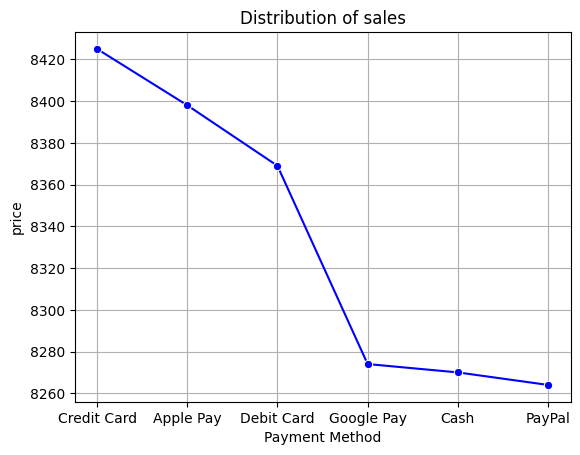

In [17]:
payment=df['Payment_Method'].value_counts()
sns.lineplot(x=payment.index,y=payment.values,color='blue',marker='o')
plt.title('Distribution of sales')
plt.xlabel('Payment Method')
plt.ylabel('price')
plt.grid()
payment


The distribution of sales by payment method shows clear preferences among customers, with some payment options being more frequently used than others, which can guide the store in optimizing payment options offered.

<h2>OVERALL CONCLUSION


Integrating these analyses provides a comprehensive view of bike sales dynamics, allowing the store to make data-driven decisions in inventory management, marketing strategies, and customer engagement initiatives, ultimately enhancing sales performance and customer satisfactio